In [1]:

using Plots

In [2]:
#параметры АЦП1
f1 = 1000 #Гц
M1 = 16 #бит
U1_min = -5
U1_max = 5
#параметры АЦП2
f2 = 10 #Гц
M2 = 3 #бит
U2_min = 0
U2_max = 3

function L(M)
    return 2^M
end
function delta_U(max,min,L)
    return (max - min)/L
end
L1 = L(M1)
L2 = L(M2)
U1 = delta_U(U1_max,U1_min,L1)
U2 = delta_U(U2_max,U2_min,L2)

function Ts(fs)
    return 1/fs
end
Ts1 = Ts(f1)
Ts2 = Ts(f2)


0.1

In [3]:
function ADC_conv(xa,L,U,min)
    x_norm = (xa.-min)./U
    x_range = clamp.(x_norm,0,L-1) #впихивает в рамки
    code = floor.(Int, x_range) #округляет вниз до целого
    x_q = code.*U.+min
    return code, x_q
end

ADC_conv (generic function with 1 method)

In [4]:
t_orig = 0:0.01:4
t_adc1 = 0:Ts1:4
t_adc2 = 0:Ts2:4

0.0:0.1:4.0

In [5]:
using Plots

function plot_adc(signal, name, X, window)
    x_orig = signal.(t_orig)
    x_adc1 = signal.(t_adc1)
    x_adc2 = signal.(t_adc2)

    code1, xq1 = ADC_conv(x_adc1, L1, U1, U1_min)
    code2, xq2 = ADC_conv(x_adc2, L2, U2, U2_min)

    p = plot(t_orig, x_orig,lw = 8,color = :grey,label = "x(t)=$(X)",
        xlabel = "t, с",ylabel = "U, В",title = "Оцифровка сигнала: $name", titlefontsize = 9,
        legend = window,grid = true)

    plot!(p, t_adc1, xq1,markersize=2,seriestype = :scatter,color = :red,
        label = "АЦП1(M=$M1, f=$f1 Гц)",markerstrokewidth = 0)

    plot!(p, t_adc2, xq2,markersize=4,seriestype = :scatter,color = :blue,
        label = "АЦП2(M=$M2, f=$f2 Гц)",markerstrokewidth = 0)

    display(p)

    #0–0.1 с
    idx_orig = (t_orig .>= 0) .& (t_orig .<= 0.1)
    idx1 = t_adc1 .<= 0.1
    idx2 = t_adc2 .<= 0.1

    p_zoom = plot(t_orig[idx_orig], x_orig[idx_orig],lw = 8,color = :grey,
        label = "x(t)=$(X)",xlabel = "t, с",ylabel = "U, В", titlefontsize = 9,
        title = "Увеличение 0–0.1 с: $name",legend = window,grid = true)

    plot!(p_zoom,t_adc1[idx1], xq1[idx1],markersize=2,seriestype = :scatter,
        color = :red,label = "АЦП1(M=$M1, f=$f1 Гц)",markerstrokewidth = 0)

    plot!(p_zoom,t_adc2[idx2], xq2[idx2],markersize=4,seriestype = :scatter,
        color = :blue,label = "АЦП2(M=$M2, f=$f2 Гц)",markerstrokewidth = 0)
    display(p_zoom)

end

plot_adc (generic function with 1 method)

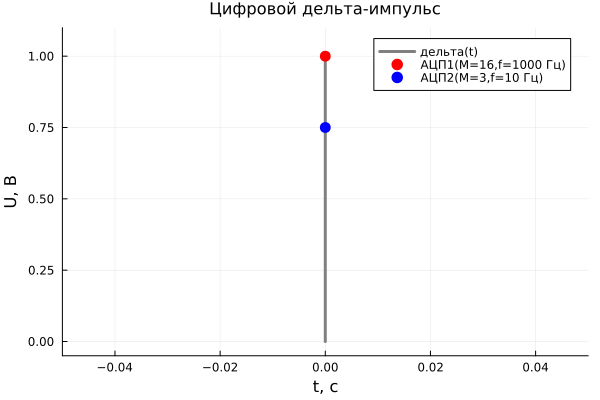

АЦП1: код = 39321, значение = 0.999908447265625
АЦП2: код = 2, значение = 0.75


In [6]:
#Дельта
signal_delta(t) = t == 0 ? 1.0 : 0.0

#t = 0
x0 = signal_delta(0)

code_delta1, xq_delta1 = ADC_conv([x0], L1, U1, U1_min)
code_delta2, xq_delta2 = ADC_conv([x0], L2, U2, U2_min)

println("АЦП1: код = ", code_delta1[1], ", значение = ", xq_delta1[1])
println("АЦП2: код = ", code_delta2[1], ", значение = ", xq_delta2[1])

p = plot(
    [0, 0],[0, 1],lw = 3,color=:grey,
    label = "дельта(t)",
    xlabel = "t, с",ylabel = "U, В",
    title = "Цифровой дельта-импульс", titlefontsize = 11,
    xlims = (-0.05, 0.05),ylims = (-0.05, 1.1),
    legend = :topright,grid = true)

scatter!(p,[0],[xq_delta1[1]],markersize = 6,label = "АЦП1(M=$(M1),f=$(f1) Гц)",color=:red,markerstrokewidth = 0)
scatter!(p,[0],[xq_delta2[1]],markersize = 6,label = "АЦП2(M=$(M2),f=$(f2) Гц)",color=:blue,markerstrokewidth = 0)

display(p)


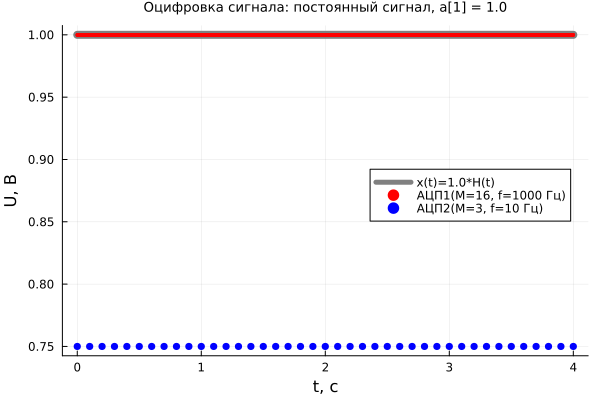

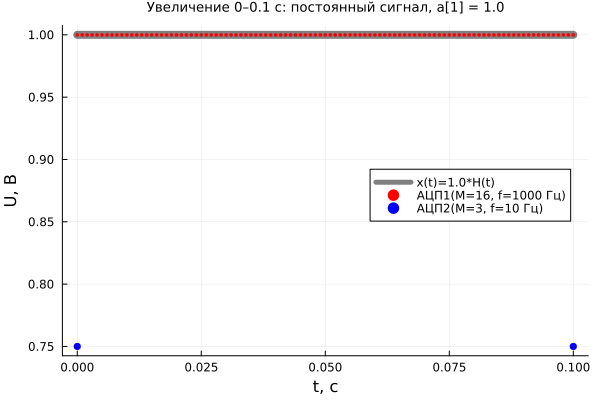

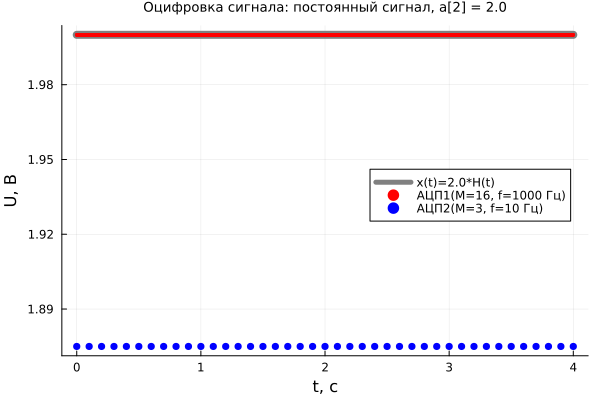

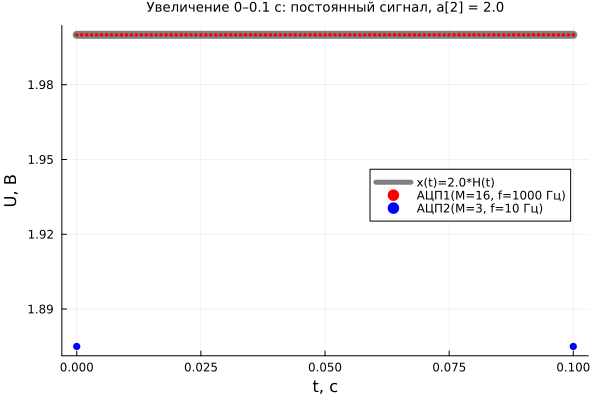

In [7]:
#Постоянный сигнал
a = [1.0,2.0]
H(t) = 1.0
signal_cont(t,i) = a[i] * H(t)

for i in 1:length(a)
    plot_adc(t->signal_cont(t, i),"постоянный сигнал, a[$i] = $(a[i])", "$(a[i])*H(t)",:right)
end


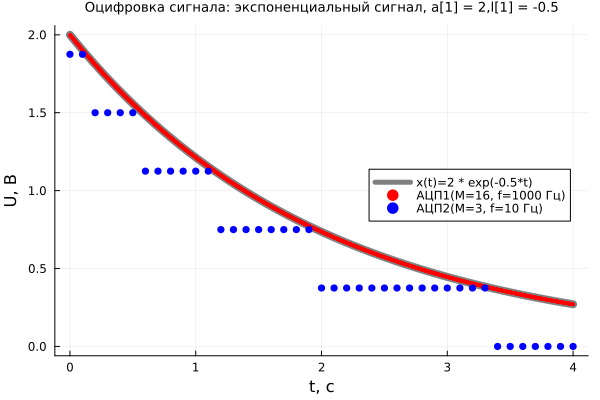

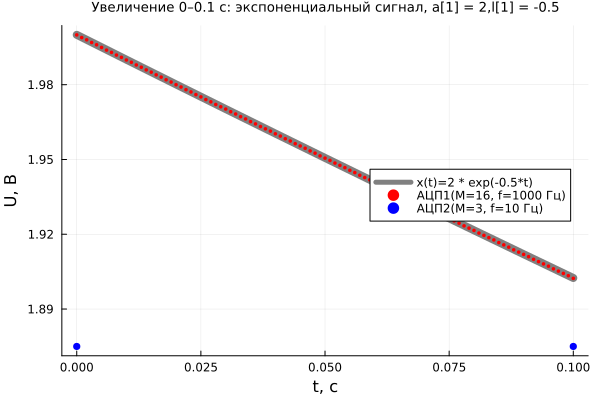

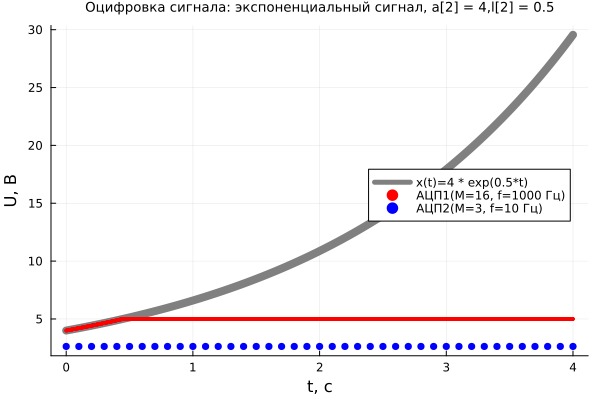

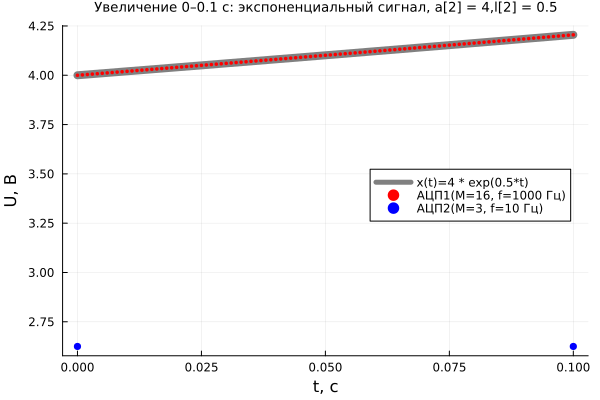

In [8]:
#Экспоненциальный сигнал
a = [2,4]
lamda = [-0.5, 0.5]
signal_exp(t,i) = a[i] * exp(lamda[i]*t)
for i in 1:length(a)
    plot_adc(t->signal_exp(t, i),"экспоненциальный сигнал, a[$i] = $(a[i]),l[$i] = $(lamda[i])",
        "$(a[i]) * exp($(lamda[i])*t)",:right)
end


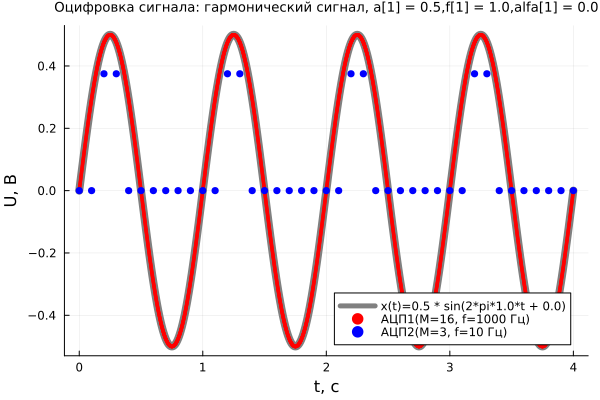

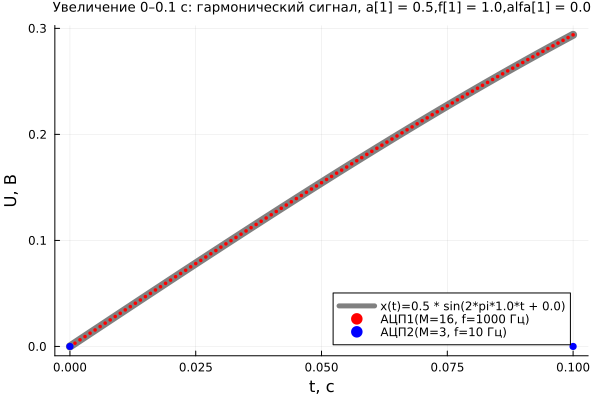

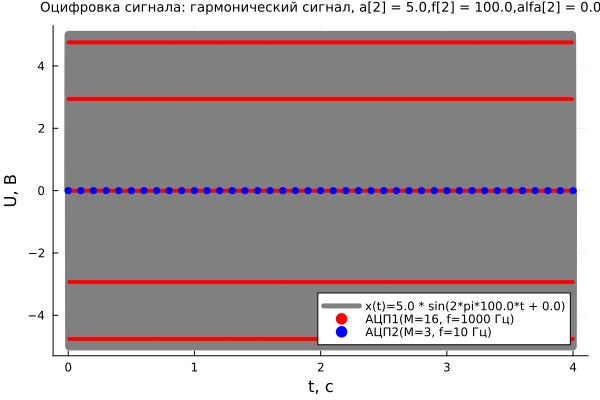

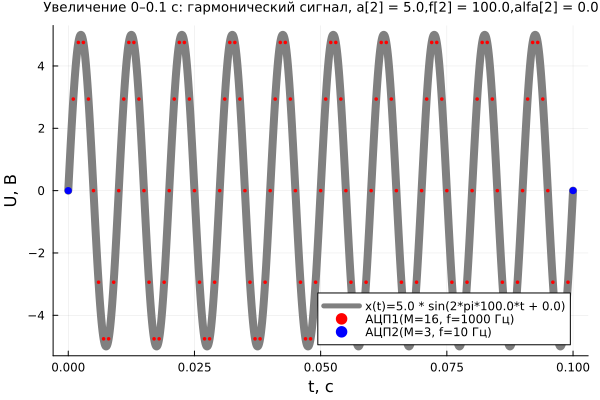

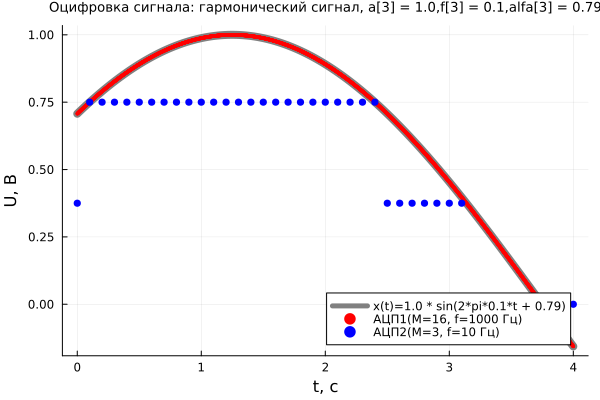

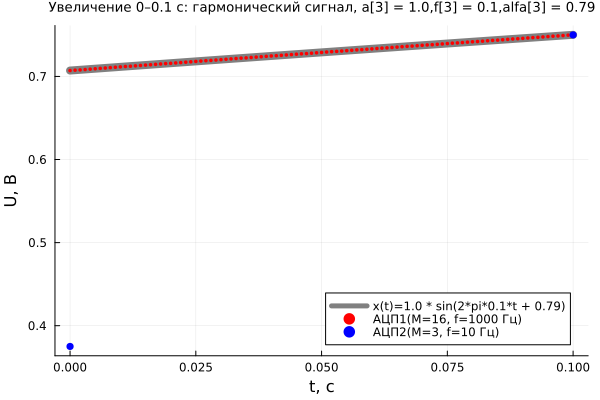

0.0:0.01:4.0

In [9]:
#Гармонический сигнал
t_orig = 0:0.0001:4
a = [0.5,5,1]
f = [1,100,0.1]
alfa = [0,0,pi/4]
signal_garm(t,i) = a[i] * sin(2*pi*f[i]*t + alfa[i])
for i in 1:length(a)
    plot_adc(t->signal_garm(t, i),
        "гармонический сигнал, a[$i] = $(a[i]),f[$i] = $(f[i]),alfa[$i] = $(round(alfa[i], digits=2))",
        "$(a[i]) * sin(2*pi*$(f[i])*t + $(round(alfa[i], digits=2)))",:bottomright)
end
t_orig = 0:0.01:4

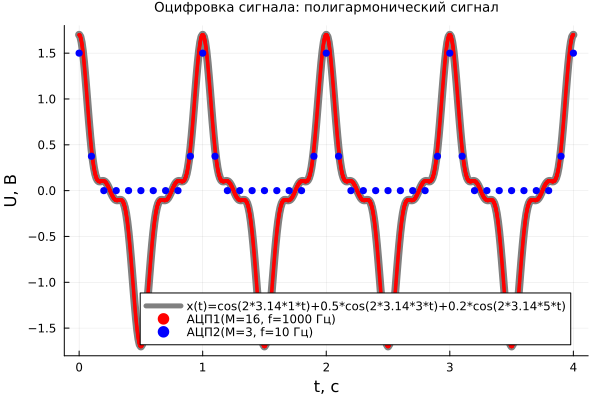

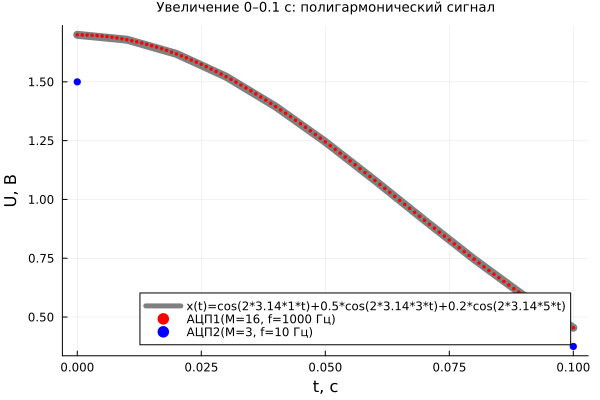

In [10]:
#Полигармонический сигнал
signal_pogarm(t) = cos(2*pi*1*t)+0.5*cos(2*pi*3*t)+0.2*cos(2*pi*5*t)
plot_adc(t->signal_pogarm(t),
        "полигармонический сигнал",
        "cos(2*$(round(pi,digits=2))*1*t)+0.5*cos(2*$(round(pi,digits=2))*3*t)+0.2*cos(2*$(round(pi,digits=2))*5*t)",
        :bottomright)


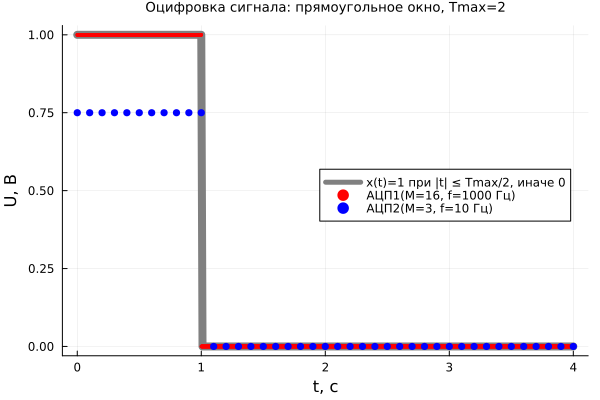

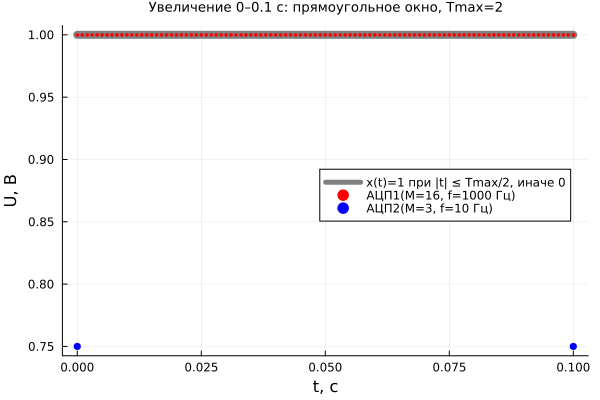

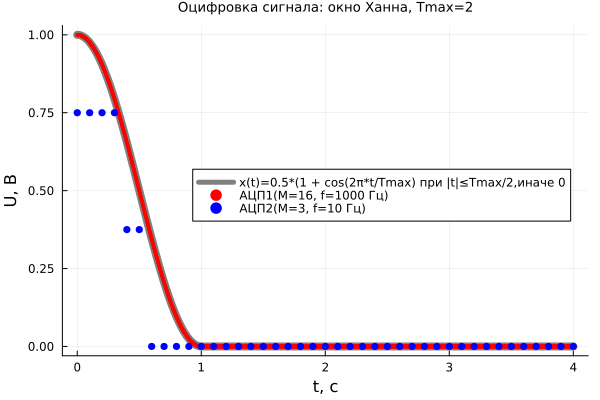

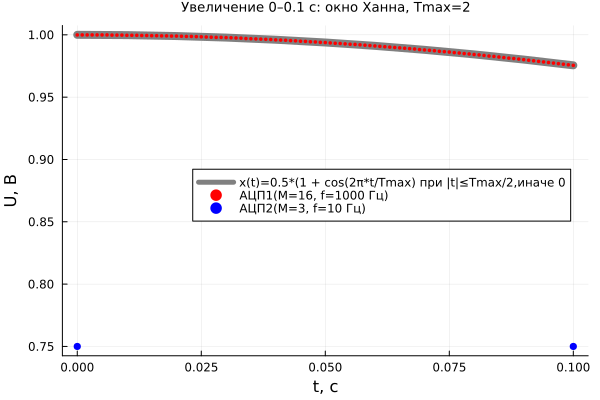

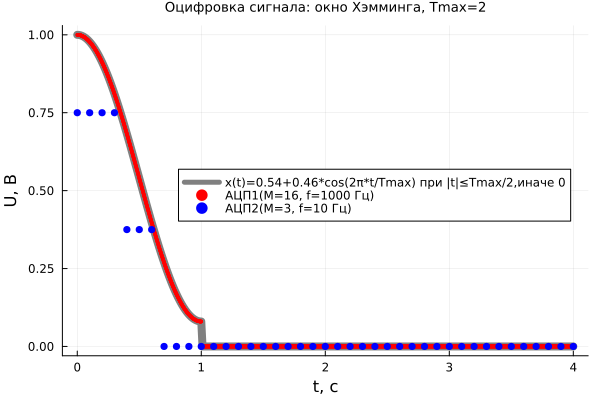

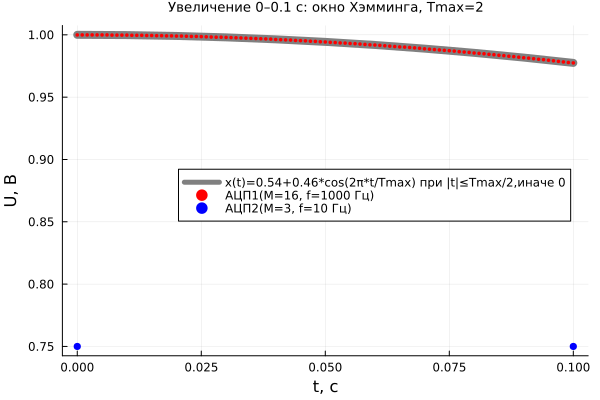

In [11]:
#Оконные функции
T_max = 2

#Прямогоугольное
w_rent(t, Tmax) = (abs(t) <= Tmax/2) ? 1.0 : 0.0
plot_adc(t->w_rent(t, T_max),
        "прямоугольное окно, Tmax=$T_max",
        "1 при |t| ≤ Tmax/2, иначе 0",:right)
#Окно Ханна
w_hann(t,Tmax) = (abs(t) <= Tmax/2) ? 0.5*(1 + cos(2*pi*t/Tmax)) : 0.0
plot_adc(t->w_hann(t, T_max),
        "окно Ханна, Tmax=$T_max",
        "0.5*(1 + cos(2π*t/Tmax) при |t|≤Tmax/2,иначе 0",:right)
#Окно Хэмминга
w_harm(t,Tmax) = (abs(t) <= Tmax/2) ? 0.54 + 0.46*cos(2*pi*t/Tmax) : 0.0
plot_adc(t->w_harm(t, T_max),
        "окно Хэмминга, Tmax=$T_max",
        "0.54+0.46*cos(2π*t/Tmax) при |t|≤Tmax/2,иначе 0",:right)

In [12]:
println("Уровней квантования для АЦП 1: ", L1)
println("Шаг квантования АЦП 1: ", U1)
println("Период дескретизации АЦП 1: ", Ts1)
print("\n")
println("Уровней квантования для АЦП 2: ", L2)
println("Шаг квантования АЦП 2: ", U2)
println("Период дескретизации АЦП 2: ", Ts2)

Уровней квантования для АЦП 1: 65536
Шаг квантования АЦП 1: 0.000152587890625
Период дескретизации АЦП 1: 0.001

Уровней квантования для АЦП 2: 8
Шаг квантования АЦП 2: 0.375
Период дескретизации АЦП 2: 0.1


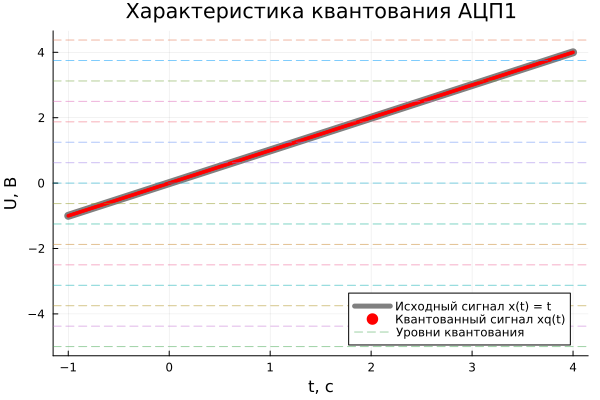

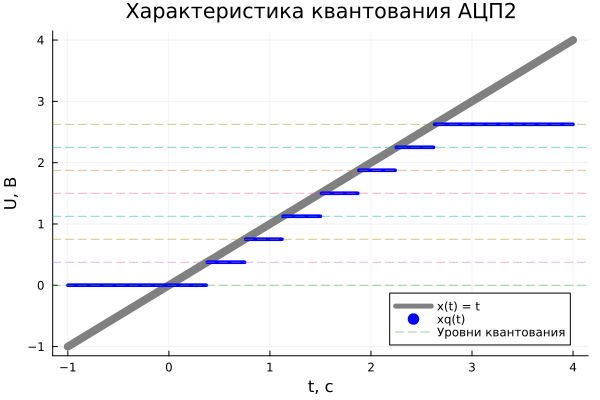

In [17]:
t = -1:0.01:4
x(t) = t

code1, xq1 = ADC_conv(x(t), L1, U1, U1_min)
code2, xq2 = ADC_conv(x(t), L2, U2, U2_min)
#АЦП1
p1 = plot(t, x, label="Исходный сигнал x(t) = t",xlabel="t, с",ylabel="U, В",
    title="Характеристика квантования АЦП1",legend=:bottomright,grid=true, color =:grey, lw = 8)
scatter!(p1, t, xq1,markersize=2,label="Квантованный сигнал xq(t)", markerstrokewidth=0, color =:red)

# Каждый 4096-й
for k in 0:4096:(L1 - 1)
    level = k * U1 + U1_min
    hline!(p1, [level],linestyle=:dash,alpha=0.5,label=k == 0 ? "Уровни квантования" : false)
end
display(p1)

#АПЦ2
p2 = plot(t, x,label="x(t) = t",xlabel="t, с",ylabel="U, В",color =:grey, lw = 8,
    title="Характеристика квантования АЦП2",legend=:bottomright,grid=true)
scatter!(p2, t, xq2,markersize=2,label="xq(t)", markerstrokewidth=0, color =:blue)

# Все уровни квантования
for k in 0:(L2 - 1)
    level = k * U2 + U2_min
    hline!(p2, [level],linestyle=:dash,alpha=0.5,label=k == 0 ? "Уровни квантования" : false)
end

display(p2)

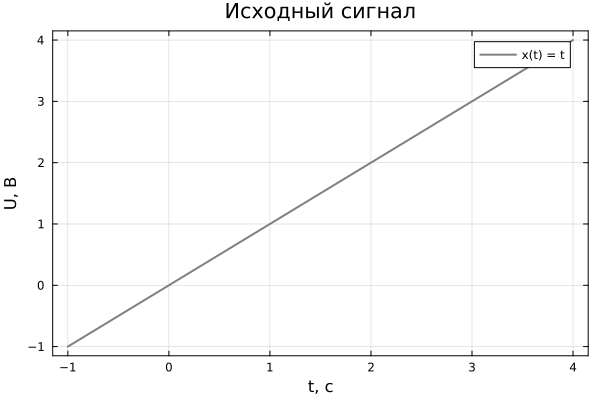

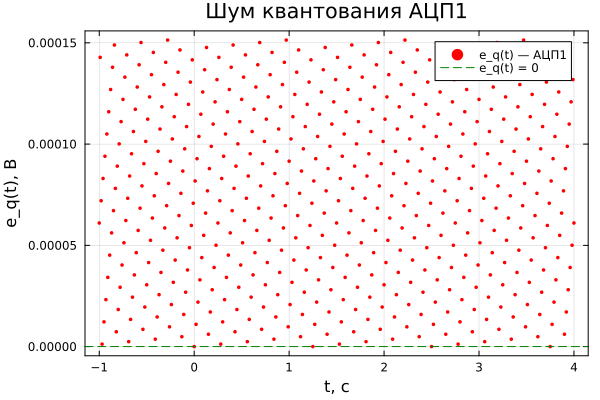

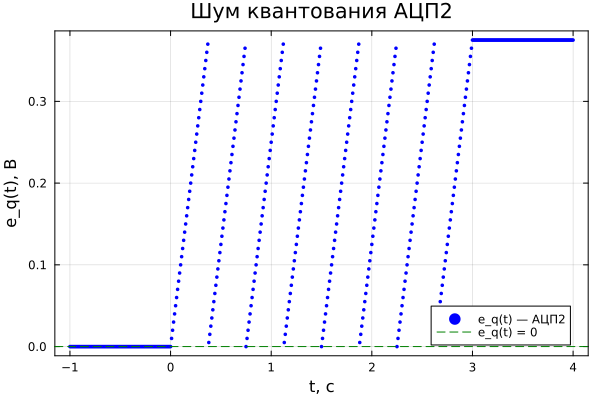

In [41]:
# Исходный сигнал на плотной сетке
t_ = -1:0.01:4
x(t) = t

# АЦП1
x_adc1 = clamp.(x(t_), U1_min, U1_max)
_, x_q1 = ADC_conv(x_adc1, L1, U1, U1_min)
eq1 = x_adc1 .- x_q1

# АЦП2
x_adc2 = clamp.(x(t_), U2_min, U2_max)
_, x_q2 = ADC_conv(x_adc2, L2, U2, U2_min)
eq2 = x_adc2 .- x_q2

# График 1: Исходный сигнал
p_orig = plot(t_, x(t_);
    seriestype = :line, linecolor = :gray, linewidth = 2,
    label = "x(t) = t",
    xlabel = "t, с", ylabel = "U, В", title = "Исходный сигнал",
    legend = :topright, grid = true, framestyle = :box
)
display(p_orig)

# График 2: Ошибка АЦП1
p3 = scatter(t_, eq1;
    label = "e_q(t) — АЦП1",
    xlabel = "t, с", ylabel = "e_q(t), В",
    title = "Шум квантования АЦП1",
    legend = :topright, grid = true, color = :red,
    markersize = 2, markerstrokewidth = 0, framestyle = :box
)
hline!(p3, [0]; linestyle = :dash, label = "e_q(t) = 0", color = :green)
display(p3)

# График 3: Ошибка АЦП2
p4 = scatter(t_, eq2;
    label = "e_q(t) — АЦП2",
    xlabel = "t, с", ylabel = "e_q(t), В",
    title = "Шум квантования АЦП2",
    legend = :bottomright, grid = true, color = :blue,
    markersize = 2, markerstrokewidth = 0, framestyle = :box
)
hline!(p4, [0]; linestyle = :dash, label = "e_q(t) = 0", color = :green)
display(p4)